In [45]:
#integrated_adata.write('/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/integrated_adata.h5ad')

In [58]:
#midmap.write('/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/midmap_integrated.h5ad')

In [1]:
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import scvi 
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from harmony import harmonize
import harmonypy as hm
from scipy.sparse import issparse
import scipy.sparse

output_dir = '/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/deliverables/'
sc.settings.figdir = output_dir

sc.settings.verbosity = 3
sc.settings.n_jobs= 12

sc.settings.set_figure_params(dpi_save=500, figsize=(8, 6))  # High DPI and size
sc.settings.figdir = output_dir  # Set the directory for saving
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = '/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/deliverables'

sc.settings.set_figure_params(dpi_save=500, figsize=(8, 6))  # High DPI and size
scvi.settings.seed = 0

pd.set_option('display.max_columns', None)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
[rank: 0] Global seed set to 0


In [2]:
midmap = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/midmap.h5ad')

In [3]:
kamath = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/filtered_adata_neuron_cellbender.h5ad')

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [4]:
integrated_adata = sc.read_h5ad('/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/integrated_adata.h5ad')

In [26]:
midmap.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 522220 × 45433
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_Library', 'original_Brain_Region', 'original_Level_1_cell_type', 'original_Level_2_cell_type', 'original_cellclass_lvl1', 'original_subclass_lvl3_1', 'original_cellclass_lvl1_n', 'original_lineage', 'original_subclass_lvl2', 'original_celltype_lvl3', 'donor', 'original_supercluster_term', 'original_cluster_id', 'original_subcluster_id', 'original_celltype', 'cell_type_lvl1', 'cell_type_lvl2', 'cell_type_lvl3', 'cell_type_lowest_res', 'cell_type_low_res', 'cell_type_med_res', 'cell_type_high_res', 'h

In [27]:
# Summary
for column in midmap.obs.columns:
    if midmap.obs[column].dtype.name == 'category' or midmap.obs[column].dtype.name == 'object':
        print(f"Summary of {column}:")
        print(midmap.obs[column].value_counts())
        print("\n" + "="*50 + "\n")


Summary of species:
Homo sapien    522220
Name: species, dtype: int64


Summary of gender:
male      378526
           85044
female     58650
Name: gender, dtype: int64


Summary of age:
            152511
50 years    103238
42 years    103167
29 years     81118
93 years     25568
90            6375
72 years      6149
84            5752
77 years      5145
66            4988
93            4789
88            4353
77            3238
89 years      3224
70            3091
56            2297
73 years      2126
55            1930
59            1896
82 years       676
84 years       537
91 years        52
Name: age, dtype: int64


Summary of instrument:
                         416044
Illumina NovaSeq 6000     96962
Illumina HiSeq 4000        9214
Name: instrument, dtype: int64


Summary of technology:
          416044
10x_v2     67467
10x_v3     38709
Name: technology, dtype: int64


Summary of atlas:
siletti    287523
altena      85044
welch       67467
wang        43477
smajic      29495
ag

#### Adding metadata to match the midmap structure

In [5]:
# Add 'instrument', 'species', and 'atlas' columns
kamath.obs = kamath.obs.assign(instrument = 'Illumina NovaSeq 6000', 
                               species = 'Homo sapien', 
                               atlas = 'kamath')

kamath.obs.rename(columns={'celltype': 'harmonized_lowest'}, inplace=True)
kamath.obs.rename(columns={'doublet_scores': 'doublet_score'}, inplace=True)
kamath.obs.rename(columns={'sex': 'gender'}, inplace=True)
kamath.obs['harmonized_lowest'].replace('neuron', 'Neuron', inplace=True)

In [ ]:
integrated_adata = sc.concat([midmap, kamath], join='outer')

# Step 4: Convert non-string columns in obs to strings
integrated_adata.obs = integrated_adata.obs.applymap(lambda x: str(x) if pd.notnull(x) else "NaN")

# Step 5: Find common genes between .var_names and .raw.var_names
# Ensure integrated_adata has a raw attribute before proceeding
if integrated_adata.raw is not None:
    common_genes = integrated_adata.var_names.intersection(integrated_adata.raw.var_names)

    # Step 6: Subset both .X and .raw.X to keep only the common genes
    integrated_adata = integrated_adata[:, common_genes]
    integrated_adata.raw = sc.AnnData(
        X=integrated_adata.raw[:, common_genes].X, 
        var=integrated_adata.raw.var.loc[common_genes]
    )
else:
    print("Raw data is not available in integrated_adata.")

# Optional: Check the data types in the obs DataFrame for verification
print(integrated_adata.obs.dtypes)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


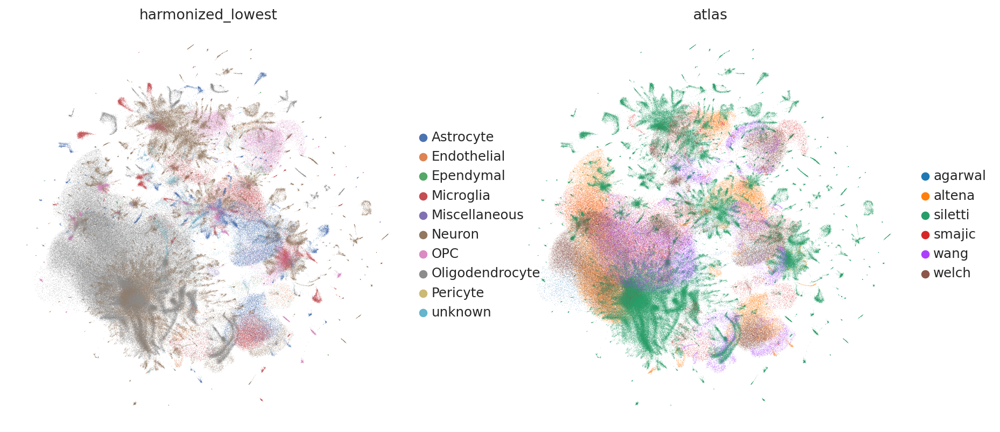

In [30]:
sc.pl.umap(midmap, color 
           = ['harmonized_lowest', 'atlas'])

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


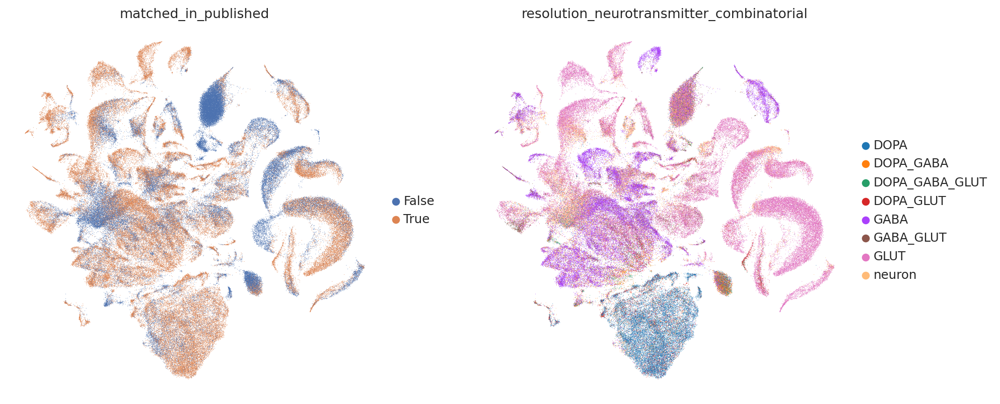

In [31]:
kamath.obs['matched_in_published'] = kamath.obs['matched_in_published'].astype('category')
sc.pl.umap(kamath, color 
           = ['matched_in_published', 'resolution_neurotransmitter_combinatorial'])

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


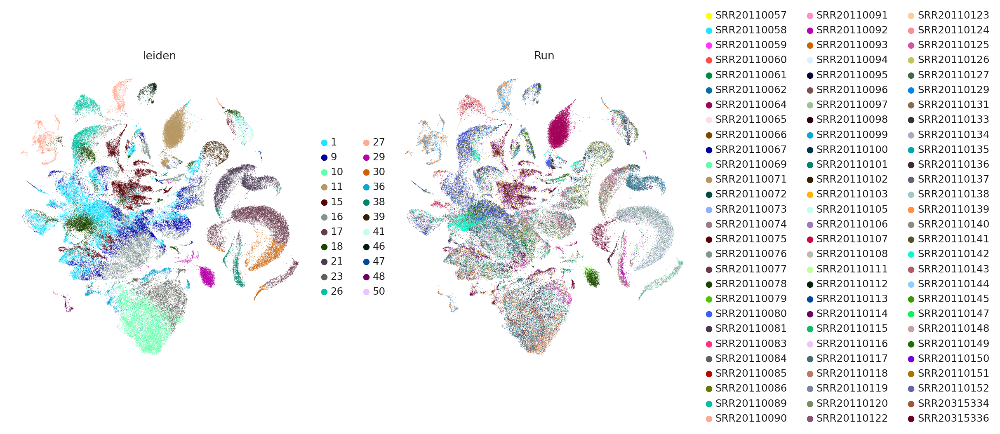

In [32]:
sc.pl.umap(kamath, color = ['leiden', 'Run'])

In [33]:
# Filter the adata.obs to get only the cells from Leiden cluster 11 which seems to cluster by itself 
leiden_cluster_11_cells = kamath.obs[kamath.obs['leiden'] == '11']

leiden_cluster_11_runs = leiden_cluster_11_cells['Run']

run_counts = leiden_cluster_11_runs.value_counts()
non_zero_run_counts = run_counts[run_counts > 0]


non_zero_run_counts


SRR20110064    12798
SRR20110080      458
SRR20110102      235
SRR20110142      159
SRR20110089       74
SRR20110062       48
SRR20110065       40
SRR20110117       33
SRR20110113       29
SRR20110090       20
SRR20110149       17
SRR20110057       16
SRR20110105       14
SRR20110078       11
SRR20110085       10
SRR20110092        8
SRR20110103        6
SRR20110139        5
SRR20110133        5
SRR20110111        5
SRR20110096        5
SRR20110129        4
SRR20110122        4
SRR20110148        4
SRR20110106        4
SRR20110083        4
SRR20110075        4
SRR20110098        3
SRR20110151        3
SRR20315336        2
SRR20110125        2
SRR20110126        2
SRR20110067        2
SRR20110138        2
SRR20110100        2
SRR20110114        2
SRR20110094        2
SRR20110073        1
SRR20110061        1
SRR20110066        1
SRR20110143        1
SRR20110150        1
SRR20110069        1
SRR20110152        1
SRR20315334        1
SRR20110071        1
SRR20110141        1
SRR20110086  

#### Trying to understand which is the main source of the batch effect in order to give it as key to scvi 

In [13]:
# Get the latent representation of cells
latent_representation = model.get_latent_representation()

# You can convert the latent representation to a DataFrame and attach it to AnnData
midmap.obsm["X_scVI"] = latent_representation

# Visualize the latent space with UMAP
sc.pp.neighbors(midmap, use_rep="X_scVI")
sc.tl.umap(midmap)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:49)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:08:23)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


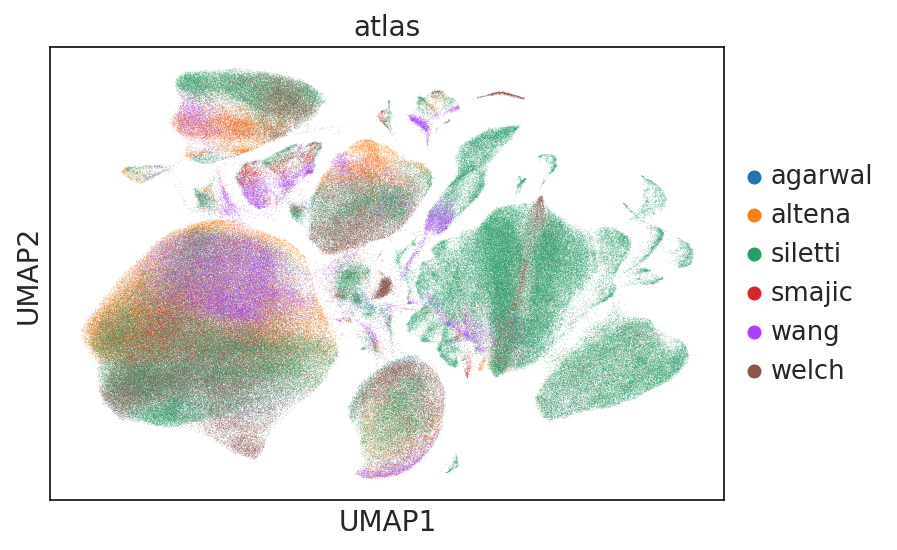

In [14]:
sc.pl.umap(midmap, color 
           ='atlas',
          save = '_midmap_atlas_scVI_noKamath')

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


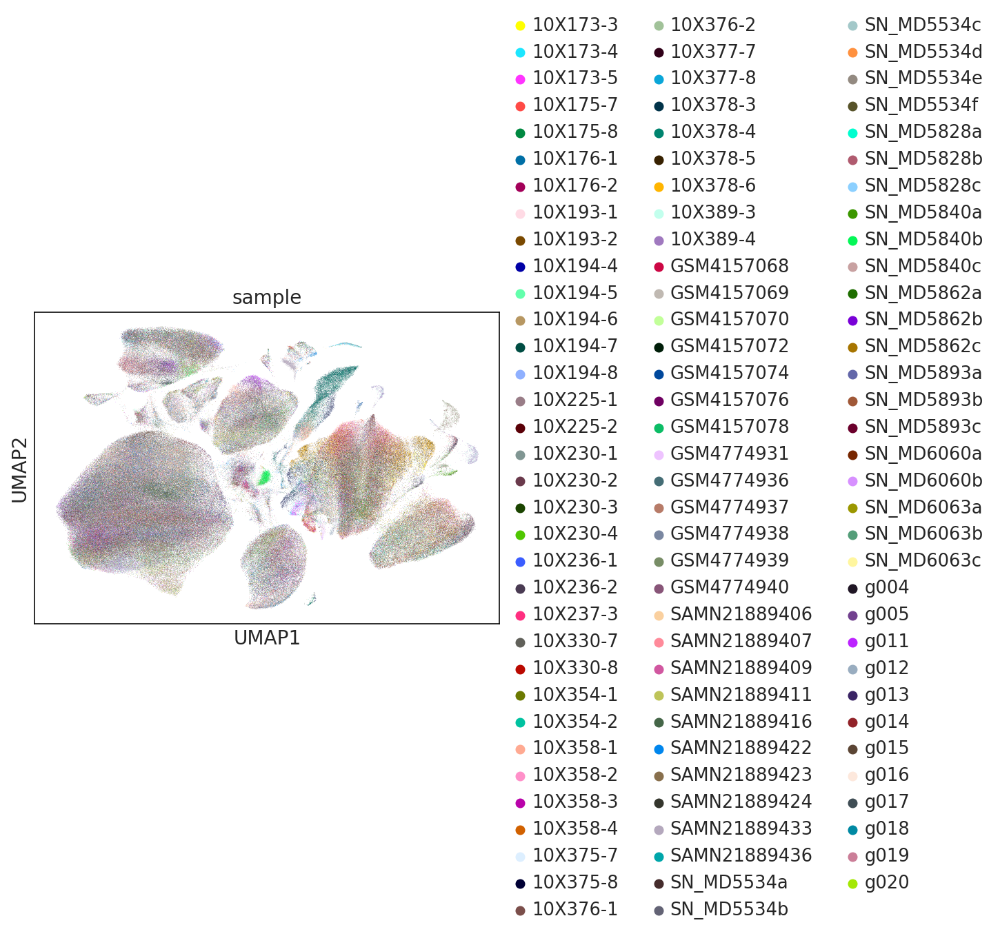

In [15]:
sc.pl.umap(midmap, color 
           ='sample',
          save = '_midmap_sample_scVI_noKamath')

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


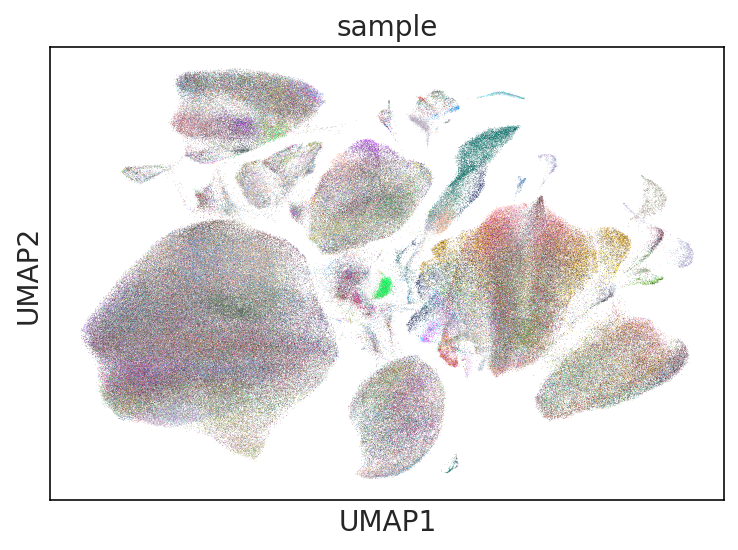

In [17]:
sc.pl.umap(midmap, color 
           ='sample',
           legend_loc = None,
          save = '_midmap_sample_no_legend_scVI_noKamath')

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


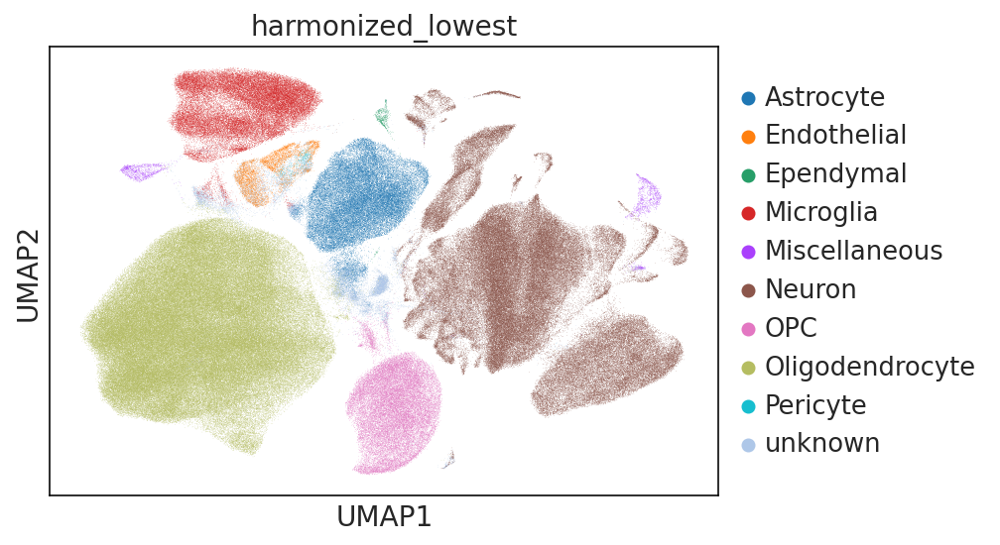

In [18]:
sc.pl.umap(midmap, color 
           ='harmonized_lowest',
          save = '_midmap_celltype_scVI_noKamath')

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


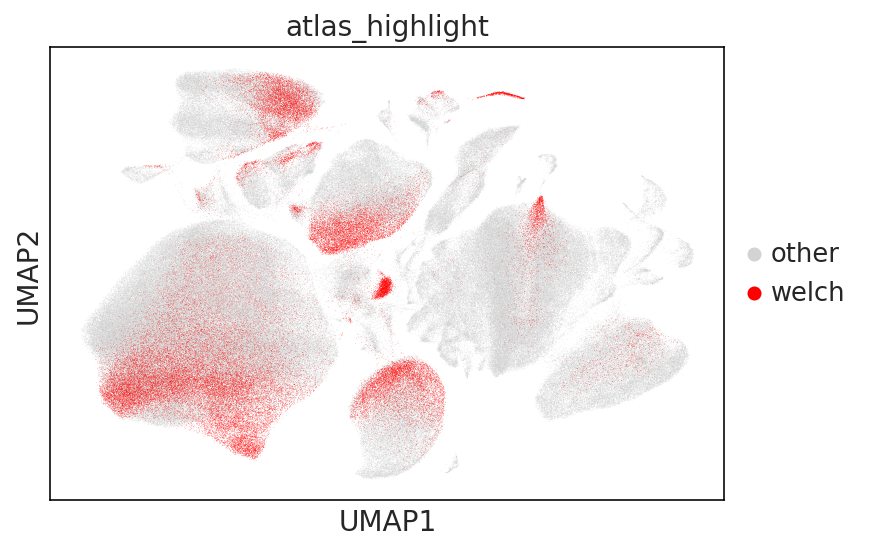

In [16]:
# Create a new column where only 'welch' is colored, others are gray
midmap.obs['atlas_highlight'] = np.where(midmap.obs['atlas'] == 'welch', 'welch', 'other')

# Plot UMAP
sc.pl.umap(midmap, color='atlas_highlight', palette={'welch': 'red', 'other': 'lightgray'}, save='_midmap_atlas_welch_highlighted')

#### This scVI model was just based on the 'sample' key as batch key on the midmap dataset alone

In [10]:
midmap.layers["counts"] = midmap.X.copy()


In [11]:
# Load the SCVI model and pass the associated AnnData
model_path = "/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/models/sample_model"
model = scvi.model.SCVI.load(model_path, adata=midmap, use_gpu = False)


INFO     File /hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/models/sample_model/model.pt already   
         downloaded                                                                                                


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [ ]:
# Get the latent representation of cells
latent_representation = model.get_latent_representation()

# You can convert the latent representation to a DataFrame and attach it to AnnData
midmap.obsm["X_scVI"] = latent_representation

# Visualize the latent space with UMAP
sc.pp.neighbors(midmap, use_rep="X_scVI")
sc.tl.umap(midmap)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


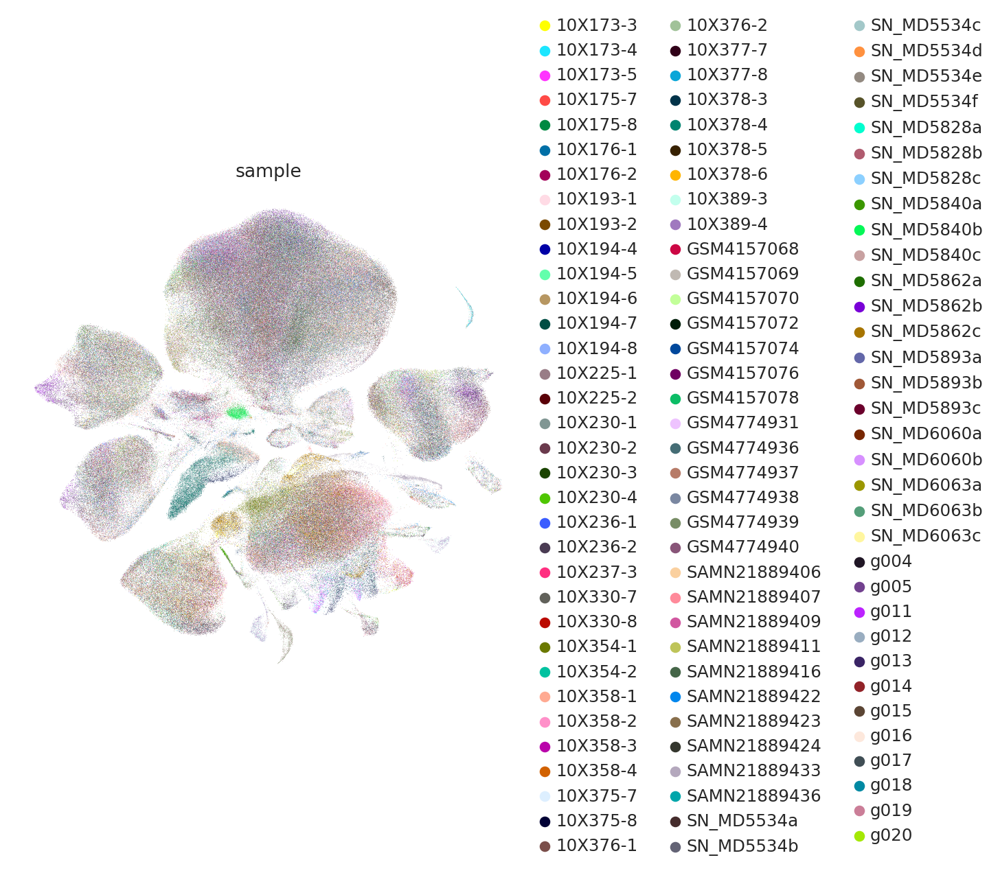

In [53]:
sc.pl.umap(midmap, color=["sample"])  

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


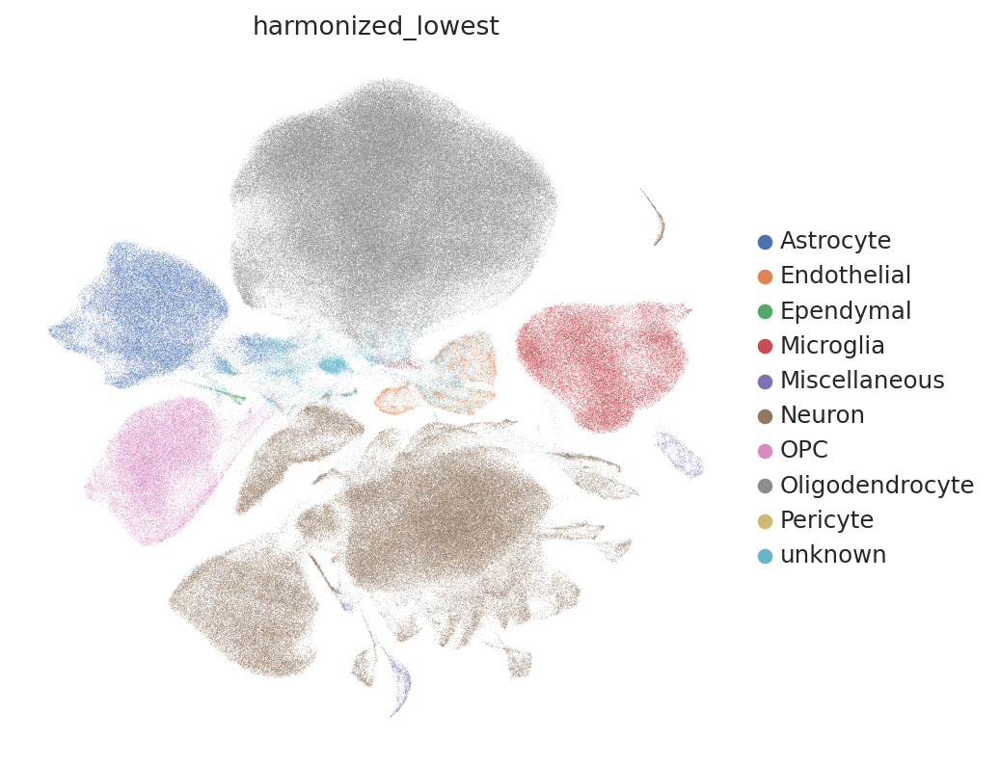

In [54]:
sc.pl.umap(midmap, color=[ 'harmonized_lowest'])  


#### This second model was trained with the batch keys being sample and atlas

In [55]:
model_path2 = "/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/sample_model2"
model = scvi.model.SCVI.load(model_path2, adata=midmap, use_gpu = False)


INFO     File /hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/sample_model2/model.pt already         
         downloaded                                                                                                


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/model/base/_base_model.py:676: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(


In [56]:
# Get the latent representation of cells
latent_representation = model.get_latent_representation()
midmap.obsm["X_scVI"] = latent_representation
sc.pp.neighbors(midmap, use_rep="X_scVI")
sc.tl.umap(midmap)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:10:14)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


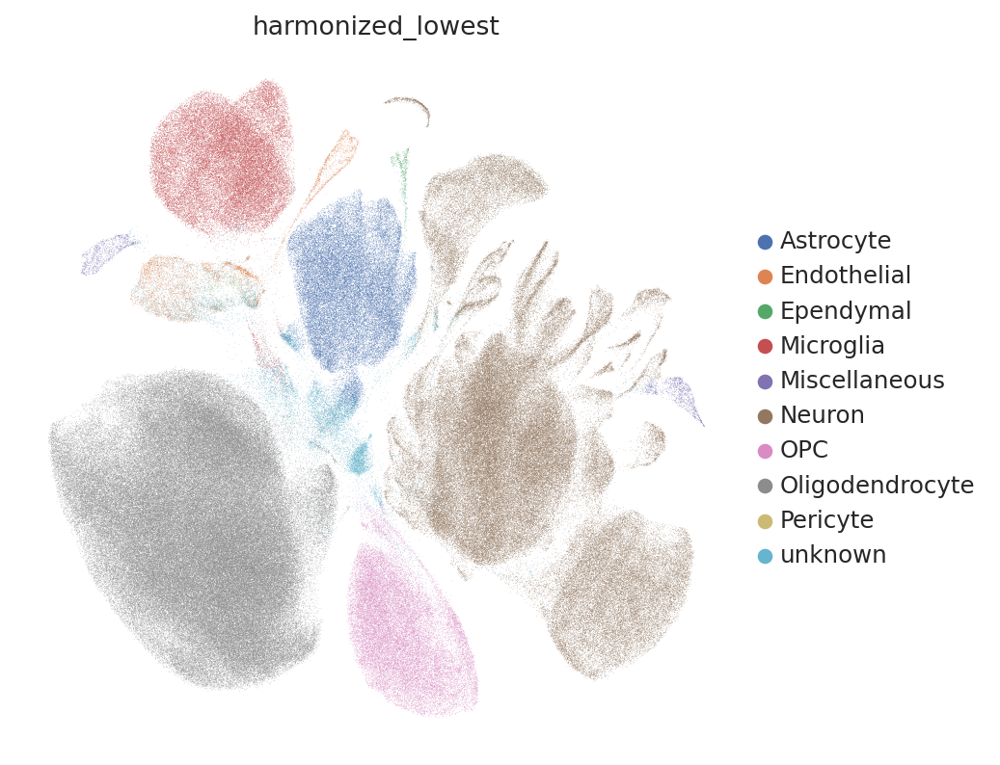

In [57]:
sc.pl.umap(midmap, color=['harmonized_lowest'])  

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


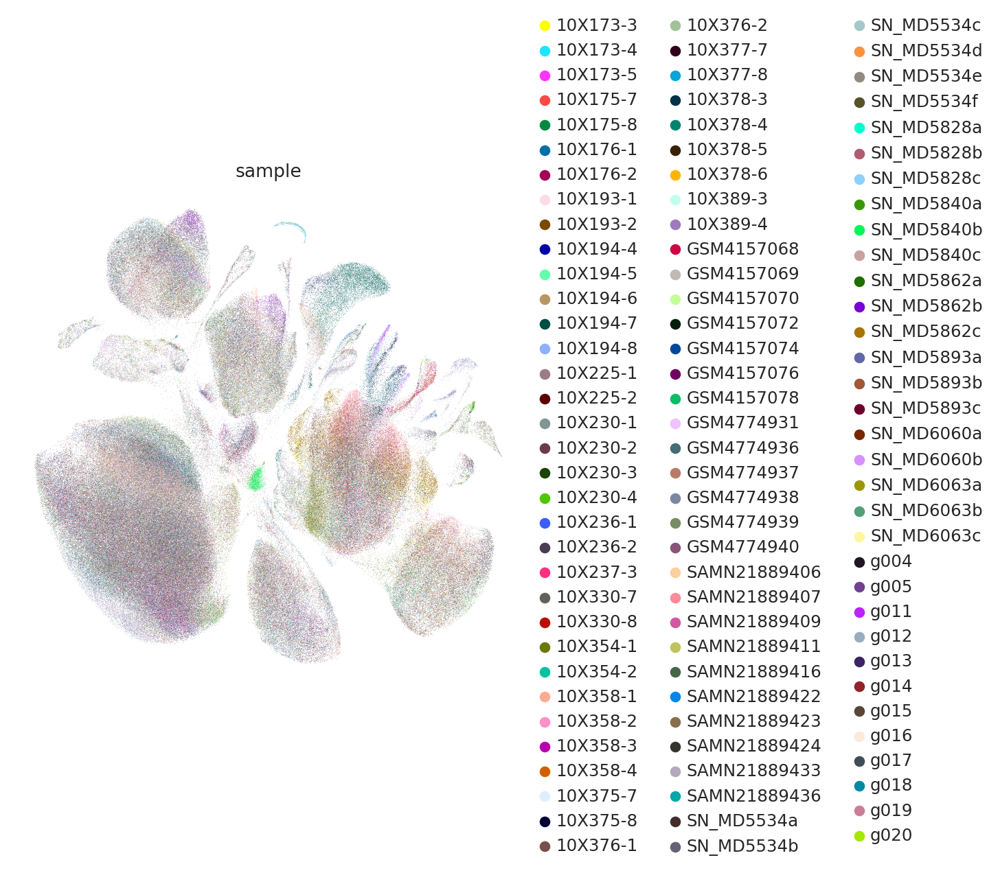

In [59]:
sc.pl.umap(midmap, color=["sample"])  

### Re-naming some column of the kamath anndata so that the concatenation will be more effective, especially for the columns of interest on which we will calculate the scVI model

In [ ]:
kamath.obs.rename(columns={'Run': 'sample', 'sex' : 'gender'}, inplace=True)

# Concatenating midmap and kamath neurons

In [41]:
integrated_adata = sc.concat([midmap, kamath], join='outer')  

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [28]:
integrated_adata

AnnData object with n_obs × n_vars = 684498 × 45434
    obs: 'species', 'gender', 'age', 'instrument', 'technology', 'atlas', 'sample', 'batch_1', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_Library', 'original_Brain_Region', 'original_Level_1_cell_type', 'original_Level_2_cell_type', 'original_cellclass_lvl1', 'original_subclass_lvl3_1', 'original_cellclass_lvl1_n', 'original_lineage', 'original_subclass_lvl2', 'original_celltype_lvl3', 'donor', 'original_supercluster_term', 'original_cluster_id', 'original_subcluster_id', 'original_celltype', 'cell_type_lvl1', 'cell_type_lvl2', 'cell_type_lvl3', 'cell_type_lowest_res', 'cell_type_low_res', 'cell_type_med_res', 'cell_type_high_res', 'harmonized_lowest_res', 'harmonized

In [ ]:
# Checking the data types in the obs DataFrame
print(integrated_adata.obs.dtypes)
# Convert all non-string columns in obs to strings
integrated_adata.obs = integrated_adata.obs.applymap(lambda x: str(x) if pd.notnull(x) else "NaN")


In [3]:
# Find the common genes between .raw.var_names and .var_names
common_genes = integrated_adata.var_names.intersection(integrated_adata.raw.var_names)

# Subset both .X and .raw.X to keep only the common genes
integrated_adata = integrated_adata[:, common_genes]

In [4]:
integrated_adata.raw = sc.AnnData(X=integrated_adata.raw[:, common_genes].X, var=integrated_adata.raw.var.loc[common_genes])

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### This model has been computes using sample and atlas as batch keys for the integrated_adata, hence midmap + kamath

In [13]:
# Load the SCVI model and pass the associated AnnData
model_path = "/hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/sample_model3"
model = scvi.model.SCVI.load(model_path, adata=integrated_adata, use_gpu = False)


INFO     File /hpc/hers_basak/rnaseq_data/Basaklab/lpossanzini/kamath/extra/sample_model3/model.pt already         
         downloaded                                                                                                


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/model/base/_base_model.py:676: UserWarning: `use_gpu` is deprecated in v1.0 and will be removed in v1.1. Please use `accelerator` and `devices` instead.
  _, _, device = parse_device_args(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scvi/model/_scvi.py:127: UserWarning: This dataset has some empty cells, this might fail inference.Data should 

In [14]:
# Get the latent representation of cells
latent_representation = model.get_latent_representation()
integrated_adata.obsm["X_scVI"] = latent_representation
sc.pp.neighbors(integrated_adata, use_rep="X_scVI")
sc.tl.umap(integrated_adata)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:59)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:17:52)


the obs value 'sample' has more than 103 categories. Uniform 'grey' color will be used for all categories.


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


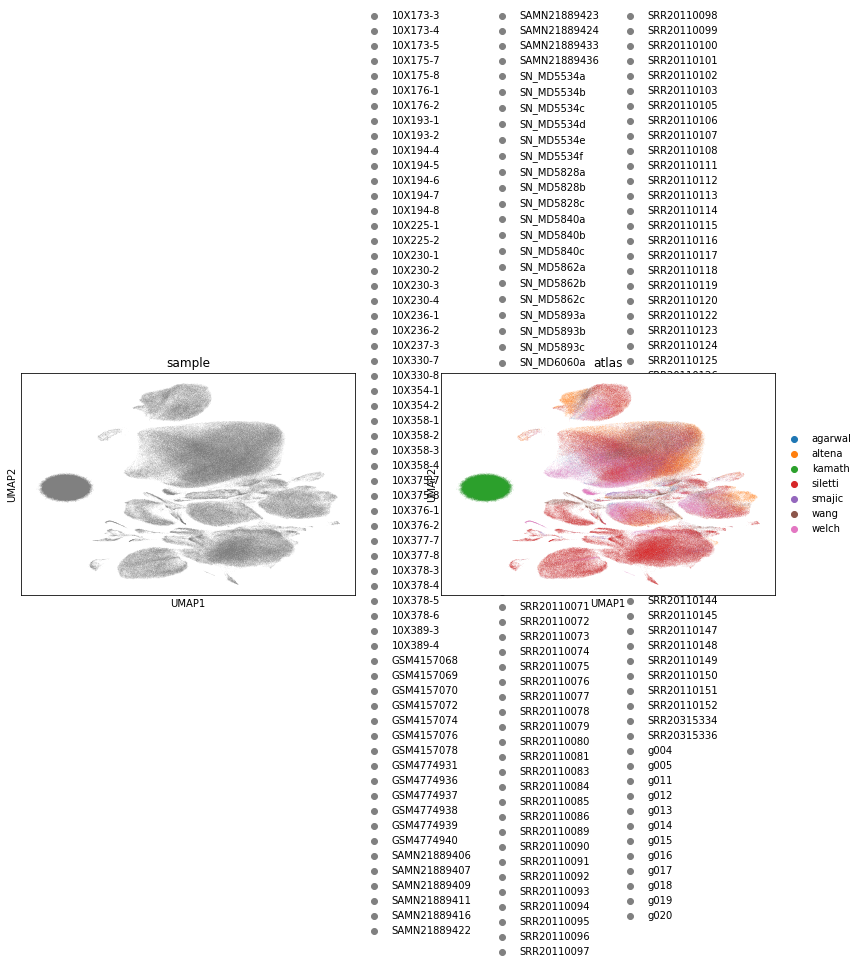

In [15]:
sc.pl.umap(integrated_adata, color=["sample", 'atlas'])  

### Trying Harmony for the integration

In [16]:
sc.tl.pca(integrated_adata, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:20:05)


In [22]:
integrated_adata.obsm['X_pca_harmony'] = harmonize(
    integrated_adata.obsm['X_pca'],
    integrated_adata.obs,
    ['sample', 'atlas'],
    theta=2,                            
    max_iter_harmony=30,    
    random_state=0
)

	Initialization is completed.
	Completed 1 / 30 iteration(s).
	Completed 2 / 30 iteration(s).
	Completed 3 / 30 iteration(s).
	Completed 4 / 30 iteration(s).
	Completed 5 / 30 iteration(s).
	Completed 6 / 30 iteration(s).
	Completed 7 / 30 iteration(s).
	Completed 8 / 30 iteration(s).
Reach convergence after 8 iteration(s).


In [23]:
sc.pp.neighbors(integrated_adata, n_neighbors=25, n_pcs=50, use_rep='X_pca_harmony')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:07)


In [24]:
sc.tl.umap(integrated_adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:16:11)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


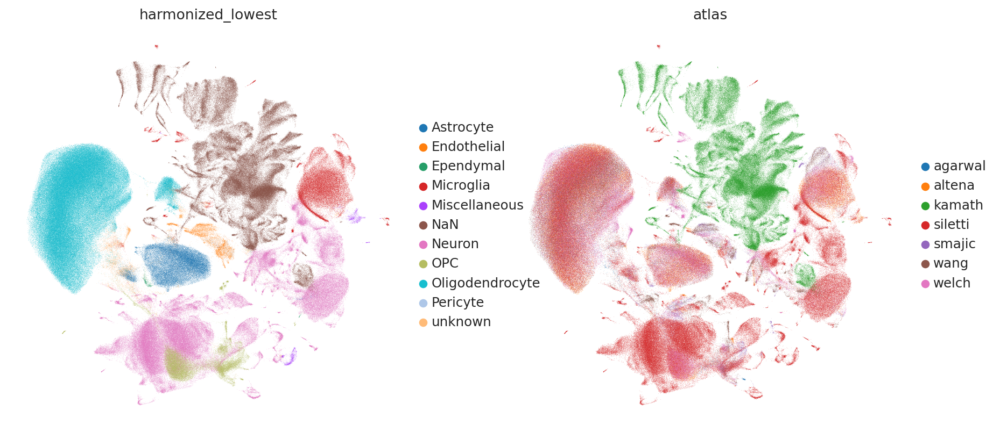

In [32]:
sc.pl.umap(integrated_adata, color=['harmonized_lowest', 'atlas'])  

In [38]:
# Trying Harmony givng just 'atlas' as covariate 

integrated_adata.obsm['X_pca_harmony'] = harmonize(
    integrated_adata.obsm['X_pca'],
    integrated_adata.obs,
    ['atlas'],
    theta=2,                            
    max_iter_harmony=30,    
    random_state=0
)

	Initialization is completed.
	Completed 1 / 30 iteration(s).
	Completed 2 / 30 iteration(s).
Reach convergence after 2 iteration(s).


In [ ]:
sc.pp.neighbors(integrated_adata, n_neighbors=25, n_pcs=50, use_rep='X_pca_harmony')

computing neighbors


In [40]:
sc.tl.umap(integrated_adata)

    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:17:04)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


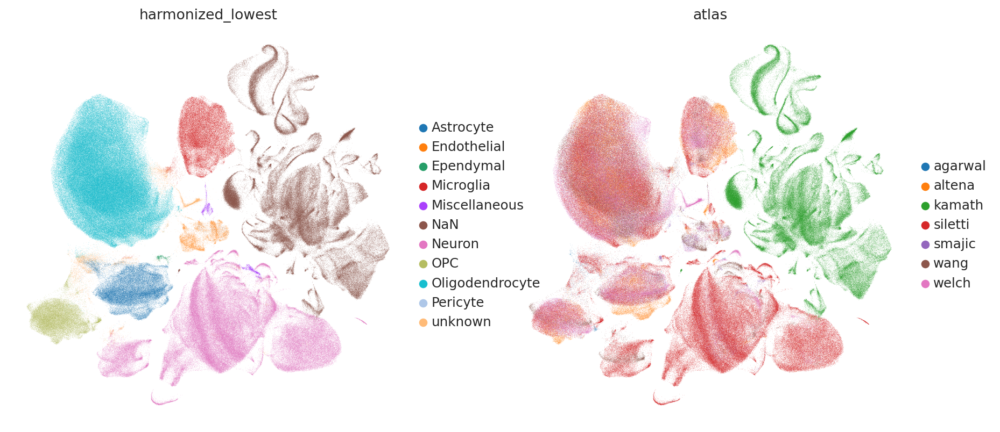

In [41]:
sc.pl.umap(integrated_adata, color=['harmonized_lowest', 'atlas'])  

In [43]:
kamath.obs['celltype'].value_counts()

neuron    162278
Name: celltype, dtype: int64

In [44]:
midmap.obs['harmonized_lowest'].value_counts()

Oligodendrocyte    230390
Neuron             157244
Microglia           41173
Astrocyte           39179
OPC                 30575
unknown             14457
Endothelial          5794
Miscellaneous        2377
Ependymal             563
Pericyte              468
Name: harmonized_lowest, dtype: int64

In [ ]:
integrated_adata_suset = sc.pp.subsample(integrated_adata, fraction=0.1)

### The Kamath dataset is not integrating properly and it looks like there is a substantial difference in the data. The next step will be carrying out an analysis to spot the cause of this missed integration

In [24]:
# Ensure that percent_mito and doublet_scores are numeric
integrated_adata.obs['percent_mito'] = pd.to_numeric(integrated_adata.obs['percent_mito'], errors='coerce')
integrated_adata.obs['doublet_scores'] = pd.to_numeric(integrated_adata.obs['doublet_scores'], errors='coerce')

In [25]:
# Filter integrated_adata in place for Kamath cells based on percent_mito and doublet_scores
integrated_adata = integrated_adata[
    ~(
        (integrated_adata.obs['atlas'] == 'kamath') &
        ((integrated_adata.obs['percent_mito'] > 10) | (integrated_adata.obs['doublet_scores'] > 0.2))
    )
].copy()


In [26]:
integrated_adata.n_obs

654563

In [28]:
if integrated_adata.raw is not None:
    print("Raw data is available.")
else:
    print("Raw data is not available.")
print(f"Raw data shape: {integrated_adata.raw.shape}")

Raw data is available.


In [5]:
if integrated_adata.raw is not None:
    # Calculate the mean of raw data
    raw_mean = integrated_adata.raw.X.mean()
    print(f"Mean value of raw data: {raw_mean}")
    
    # Calculate the mean of normalized data in .X
    normalized_mean = integrated_adata.X.mean()
    print(f"Mean value of normalized data (.X): {normalized_mean}")


Mean value of raw data: 0.26769400920133674
Mean value of normalized data (.X): 0.0554361529648304


In [7]:
integrated_adata.X = integrated_adata.raw.X.copy()  # Revert .X to the raw counts stored in .raw

In [8]:
sc.pp.normalize_total(integrated_adata, target_sum=1e4)  # Normalize total counts to 10,000 per cell
sc.pp.log1p(integrated_adata)  # Log1p transformation to stabilize variance

normalizing counts per cell
    finished (0:00:43)


In [9]:
sc.tl.pca(integrated_adata, n_comps=50, svd_solver='arpack', random_state=0, return_info=True)


computing PCA
    with n_comps=50
    finished (0:19:35)


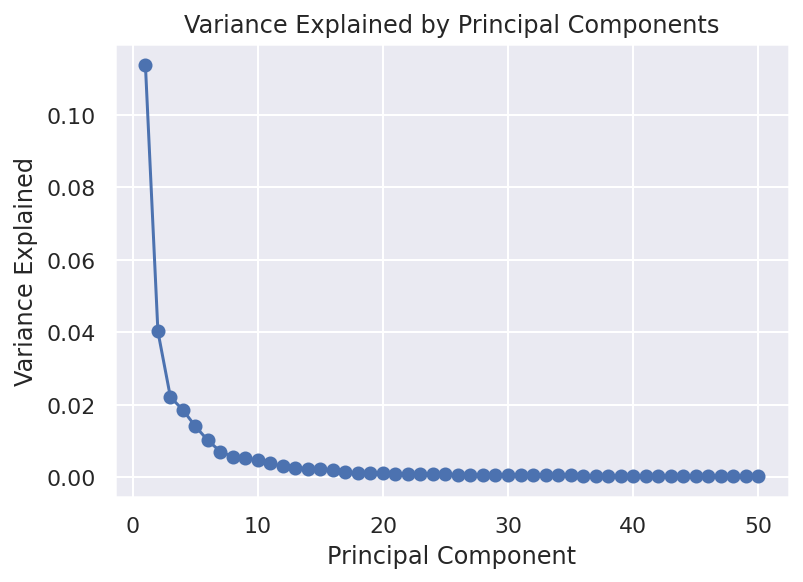

In [10]:
plt.plot(range(1, len(integrated_adata.uns['pca']['variance_ratio']) + 1), integrated_adata.uns['pca']['variance_ratio'], marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Variance Explained by Principal Components')
plt.show()

In [15]:
# Step 1: Compute the neighborhood graph
sc.pp.neighbors(integrated_adata, n_neighbors=15, n_pcs=40)  # Use the appropriate number of PCs based on your dataset


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:17)


In [16]:
sc.tl.umap(integrated_adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:20:01)
